In [1]:
# OPTIONAL: Load the "autoreload" extension so that code can change. But blacklist large modules
%load_ext autoreload
%autoreload 2
%aimport -pandas
%aimport -torch
%aimport -numpy
%aimport -matplotlib
%aimport -dask
%aimport -tqdm
%matplotlib inline

In [2]:
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
from tqdm.auto import tqdm

In [3]:
import warnings
warnings.simplefilter('once')
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
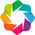

In [45]:
import holoviews as hv
from holoviews import opts
from holoviews.operation.datashader import datashade, dynspread
hv.extension('bokeh', inline=True)
from seq2seq_time.visualization.hv_ggplot import ggplot_theme
hv.renderer('bokeh').theme = ggplot_theme

# holoview datashader timeseries options
%opts RGB [width=800 height=200 show_grid=True active_tools=["xwheel_zoom"] default_tools=["xpan","xwheel_zoom", "reset", "hover"] toolbar="right"]
%opts Curve [width=800 height=200 show_grid=True active_tools=["xwheel_zoom"] default_tools=["xpan","xwheel_zoom", "reset", "hover"] toolbar="right"]
%opts Scatter [width=800 height=200 show_grid=True active_tools=["xwheel_zoom"] default_tools=["xpan","xwheel_zoom", "reset", "hover"] toolbar="right"]
%opts Layout [width=800 height=200]

## Parameters

In [5]:
# # device = "cuda" if torch.cuda.is_available() else "cpu"
# print(f'using {device}')

window_past = 48*2
window_future = 48*2
batch_size = 128
datasets_root = Path('../data/processed/')

## Plot helpers

## Datasets

In [6]:
from seq2seq_time.data.data import IMOSCurrentsVel, AppliancesEnergyPrediction, BejingPM25, GasSensor, MetroInterstateTraffic

datasets = [IMOSCurrentsVel, BejingPM25, GasSensor, AppliancesEnergyPrediction, MetroInterstateTraffic, ]
datasets

[seq2seq_time.data.data.IMOSCurrentsVel,
 seq2seq_time.data.data.BejingPM25,
 seq2seq_time.data.data.GasSensor,
 seq2seq_time.data.data.AppliancesEnergyPrediction,
 seq2seq_time.data.data.MetroInterstateTraffic]

In [8]:
# View train, test, val splits
l = hv.Layout()
for dataset in datasets:
    d = dataset(datasets_root)
    
    p = dynspread(
        datashade(hv.Scatter(d.df_train[d.columns_target[0]]),
                  cmap='red'))
    p *= dynspread(
        datashade(hv.Scatter(d.df_val[d.columns_target[0]]),
                  cmap='green'))
    p *= dynspread(
        datashade(hv.Scatter(d.df_test[d.columns_target[0]]),
                  cmap='blue'))
    p = p.opts(title=f"{dataset}")
    display(p)

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [TIME,SPD]   (R,G,B,A)
      .RGB.II  :RGB   [TIME,SPD]   (R,G,B,A)
      .RGB.III :RGB   [TIME,SPD]   (R,G,B,A)

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [index,log_pm2.5]   (R,G,B,A)
      .RGB.II  :RGB   [index,log_pm2.5]   (R,G,B,A)
      .RGB.III :RGB   [index,log_pm2.5]   (R,G,B,A)

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [Time (s),R1 (MOhm)]   (R,G,B,A)
      .RGB.II  :RGB   [Time (s),R1 (MOhm)]   (R,G,B,A)
      .RGB.III :RGB   [Time (s),R1 (MOhm)]   (R,G,B,A)

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [date,log_Appliances]   (R,G,B,A)
      .RGB.II  :RGB   [date,log_Appliances]   (R,G,B,A)
      .RGB.III :RGB   [date,log_Appliances]   (R,G,B,A)

:DynamicMap   []
   :Overlay
      .RGB.I   :RGB   [date_time,traffic_volume]   (R,G,B,A)
      .RGB.II  :RGB   [date_time,traffic_volume]   (R,G,B,A)
      .RGB.III :RGB   [date_time,traffic_volume]   (R,G,B,A)

In [69]:
# plot a batch
def plot_batch_y(ds, i):
    x_past, y_past, x_future, y_future = ds.get_rows(i)
    y = pd.concat([y_past, y_future])
    p = hv.Scatter(y)

    now = y_past.index[-1]
    p *= hv.VLine(now).relabel('now').opts(color='red')
    return p

def plot_batches_y(dataset):
    ds_name = type(dataset).__name__
    opts=dict(width=200, height=100, xaxis=None, yaxis=None)
    ds_train, ds_val, ds_test = d.to_datasets(window_past=window_past,
                                              window_future=window_future)
    n = 4
    max_i = min(len(ds_train), len(ds_val), len(ds_test))
    ii = list(np.linspace(0, max_i-10, n-1).astype(int)) + [-1]
    l = hv.Layout()
    for i in ii:
        l += plot_batch_y(ds_train, i).opts(title=f'train {i}', **opts) 
        l += plot_batch_y(ds_val, i).opts(title=f'val {i}', **opts)
        l += plot_batch_y(ds_test, i).opts(title=f'test {i}', **opts)
    return l.opts(shared_axes=False, toolbar='right', title=ds_name).cols(3)

In [138]:

    

# View train, test, val splits
for dataset in datasets:
    d = dataset(datasets_root)
    display(plot_batches_y(d))

:Layout
   .Overlay.I    :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.II   :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.III  :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.IV   :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.V    :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.VI   :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.VII  :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.VIII :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.IX   :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.X    :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.XI   :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]
   .Overlay.XII  :Overlay
      .Scatter.I :Scatter   [TIME]   (SPD)
      .VLine.Now :VLine   [x,y]

:Layout
   .Overlay.I    :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.II   :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.III  :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.IV   :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.V    :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.VI   :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.VII  :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.VIII :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.IX   :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.X    :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.XI   :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]
   .Overlay.XII  :Overlay
      .Scatter.I :Scatter   [index]   (log_pm2.5)
      .VLine.Now :VLine   [x,y]

:Layout
   .Overlay.I    :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.II   :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.III  :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.IV   :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.V    :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.VI   :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.VII  :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.VIII :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.IX   :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.X    :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.XI   :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]
   .Overlay.XII  :Overlay
      .Scatter.I :Scatter   [Time (s)]   (R1 (MOhm))
      .VLine.Now :VLine   [x,y]

:Layout
   .Overlay.I    :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.II   :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.III  :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.IV   :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.V    :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.VI   :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.VII  :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.VIII :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.IX   :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.X    :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.XI   :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]
   .Overlay.XII  :Overlay
      .Scatter.I :Scatter   [date]   (log_Appliances)
      .VLine.Now :VLine   [x,y]

:Layout
   .Overlay.I    :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.II   :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.III  :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.IV   :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.V    :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.VI   :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.VII  :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.VIII :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.IX   :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.X    :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.XI   :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]
   .Overlay.XII  :Overlay
      .Scatter.I :Scatter   [date_time]   (traffic_volume)
      .VLine.Now :VLine   [x,y]

In [143]:
def plot_batch_x(ds, i):
    """Plot input features"""
    x_past, y_past, x_future, y_future = ds.get_rows(10)
    x = pd.concat([x_past, x_future])
    p = hv.NdOverlay({
        col: hv.Curve(x[col]) for col in x.columns
    }, kdims='column')
    now = y_past.index[-1]
    p *= hv.VLine(now).relabel('now').opts(color='red')
    return p

def plot_batches_x(d):
    """Plot input features for multiple batch"""
    ds_train, ds_val, ds_test = d.to_datasets(window_past=window_past,
                                              window_future=window_future)
    l = plot_batch_x(ds_train, 10) + plot_batch_x(ds_val, 10) + plot_batch_x(ds_test, 10)
    l = l.cols(1).opts(shared_axes=False, title=f'{type(d).__name__}')
    return l

In [142]:
# View train, test, val splits
for dataset in datasets:
    d = dataset(datasets_root)
    display(plot_batches_x(d))

:Layout
   .Overlay.I   :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [TIME]   (tsp_days)
      .VLine.Now   :VLine   [x,y]
   .Overlay.II  :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [TIME]   (tsp_days)
      .VLine.Now   :VLine   [x,y]
   .Overlay.III :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [TIME]   (tsp_days)
      .VLine.Now   :VLine   [x,y]

None

:Layout
   .Overlay.I   :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [index]   (week)
      .VLine.Now   :VLine   [x,y]
   .Overlay.II  :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [index]   (week)
      .VLine.Now   :VLine   [x,y]
   .Overlay.III :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [index]   (week)
      .VLine.Now   :VLine   [x,y]

None

:Layout
   .Overlay.I   :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [Time (s)]   (tsp_days)
      .VLine.Now   :VLine   [x,y]
   .Overlay.II  :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [Time (s)]   (tsp_days)
      .VLine.Now   :VLine   [x,y]
   .Overlay.III :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [Time (s)]   (tsp_days)
      .VLine.Now   :VLine   [x,y]

None

:Layout
   .Overlay.I   :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [date]   (week)
      .VLine.Now   :VLine   [x,y]
   .Overlay.II  :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [date]   (week)
      .VLine.Now   :VLine   [x,y]
   .Overlay.III :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [date]   (week)
      .VLine.Now   :VLine   [x,y]

None

:Layout
   .Overlay.I   :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [date_time]   (week)
      .VLine.Now   :VLine   [x,y]
   .Overlay.II  :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [date_time]   (week)
      .VLine.Now   :VLine   [x,y]
   .Overlay.III :Overlay
      .NdOverlay.I :NdOverlay   [column]
         :Curve   [date_time]   (week)
      .VLine.Now   :VLine   [x,y]

None